## Actividad 2 — Hipótesis de trabajo

`ApneaSueño.pdf se usa como marco de referencia para interpretar los eventos
respiratorios. Aunque está dirigida a población pediátrica, sus
definiciones de apnea obstructiva, apnea central e hipopnea son las mismas
que emplea el código de marcas de `slpdb` y sirven como criterio de
interpretación (no como diagnóstico) para el registro adulto `slp59m`.

**Hipótesis de trabajo:**

> Durante los episodios de apnea o hipopnea se producirán cambios
> identificables en las señales respiratorias y en su contenido espectral.
> Estos cambios podrán estar acompañados por variaciones en la saturación
> de oxígeno y por modificaciones en otras señales fisiológicas registradas.
>
> En particular: en una **apnea obstructiva** se espera que disminuya o
> cese el flujo respiratorio nasal mientras continúa el esfuerzo
> respiratorio abdominal; en una **apnea central** se espera que
> disminuyan tanto la respiración nasal como la abdominal de forma
> simultánea; en una **hipopnea** se espera una reducción parcial (no un
> cese completo) de la actividad respiratoria; y algunos eventos podrán
> relacionarse con cambios posteriores (no necesariamente inmediatos) en
> la saturación de oxígeno, así como con modificaciones puntuales en ECG,
> presión arterial, EEG o volumen sistólico.

Esta hipótesis se contrasta, de forma exclusivamente descriptiva, con los
episodios seleccionados en la Actividad 4.

In [1]:
%matplotlib inline
import re
import zipfile
from pathlib import Path
from datetime import datetime

import numpy as np
import pandas as pd
import scipy.io as sio
from scipy import signal
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

try:
    RAIZ = Path(__file__).resolve().parent
except NameError:
    RAIZ = Path.cwd()

DIR_RESULTADOS = RAIZ / "resultados"
DIR_FIGURAS = DIR_RESULTADOS / "figuras"
DIR_EXTRAIDO = RAIZ / "_datos_extraidos"

DIR_FIGURAS.mkdir(parents=True, exist_ok=True)
DIR_EXTRAIDO.mkdir(parents=True, exist_ok=True)

ZIP_SLP59M = RAIZ / "slp59m.zip"
EPS = 1e-12  # constante para evitar log(0) en dB

plt.rcParams.update({
    "figure.dpi": 100,
    "savefig.dpi": 300,
    "font.size": 9,
    "axes.titlesize": 10,
    "axes.labelsize": 9,
})

# Codigo de marcas de slpdb (https://physionet.org/files/slpdb/1.0.0/slpdb.html)
ETAPAS_SUENO = {"W": "Vigilia", "1": "Etapa 1", "2": "Etapa 2", "3": "Etapa 3",
                 "4": "Etapa 4", "R": "Sueno REM"}
EVENTOS = {"H": "Hipopnea", "HA": "Hipopnea con arousal", "OA": "Apnea obstructiva",
           "X": "Apnea obstructiva con arousal", "CA": "Apnea central",
           "CAA": "Apnea central con arousal", "L": "Movimiento de piernas",
           "LA": "Movimiento de piernas con arousal", "A": "Arousal no especificado",
           "MT": "Tiempo de movimiento"}
DURACION_EPOCA_S = 30.0


def log(msg):
    print(f"[slp59m] {msg}")

## Actividad 1 

In [2]:
def extraer_zip():
    with zipfile.ZipFile(ZIP_SLP59M, "r") as zf:
        zf.extractall(DIR_EXTRAIDO)
    log(f"ZIP extraido en {DIR_EXTRAIDO}")
    return DIR_EXTRAIDO


def leer_info(dir_extraido):
    """Lee slp59m.info y extrae fs, duracion y la tabla de canales
    (nombre, ganancia, base, unidades) directamente del texto del archivo."""
    texto = (dir_extraido / "slp59m.info").read_text(encoding="utf-8", errors="replace")

    fs = float(re.search(r"Sampling frequency:\s*([\d.]+)\s*Hz", texto).group(1))
    h, mi, s = (int(x) for x in re.search(r"Duration:\s*([\d:]+)", texto).group(1).split(":"))
    duracion_s = h * 3600 + mi * 60 + s

    m_dims = re.search(r"val has (\d+) rows.*?(\d+) columns", texto)
    n_senales, n_muestras = int(m_dims.group(1)), int(m_dims.group(2))

    filas = []
    for linea in texto.splitlines():
        m = re.match(r"\s*(\d+)\s+(.+?)\s+([\-\d.]+)\s+([\-\d.]+)\s+(\S+)\s*$", linea)
        if m and m.group(2).strip().lower() != "signal" and 1 <= int(m.group(1)) <= n_senales:
            filas.append({"fila": int(m.group(1)), "senal": m.group(2).strip(),
                           "ganancia": float(m.group(3)), "base": float(m.group(4)),
                           "unidades": m.group(5).strip()})
    tabla_senales = pd.DataFrame(filas).sort_values("fila").reset_index(drop=True)
    assert len(tabla_senales) == n_senales, "No se pudieron leer todos los canales del .info"

    log(f"slp59m.info: fs={fs} Hz, duracion={duracion_s} s, {n_senales} canales x {n_muestras} muestras")
    return {"fs": fs, "duracion_s": duracion_s, "n_senales": n_senales,
            "n_muestras": n_muestras, "tabla_senales": tabla_senales, "texto_crudo": texto}


def cargar_val(dir_extraido):
    d = sio.loadmat(dir_extraido / "slp59m.mat")
    assert "val" in d, "No se encontro la variable 'val' en slp59m.mat"
    log(f"val cargado: shape={d['val'].shape}, dtype={d['val'].dtype}")
    return d["val"]


def convertir_unidades(val, tabla_senales):
    """valor_fisico = (valor_crudo - base) / ganancia, segun slp59m.info."""
    val_f = val.astype(np.float64)
    fisico = np.empty_like(val_f)
    for _, fila in tabla_senales.iterrows():
        i = fila["fila"] - 1
        fisico[i, :] = (val_f[i, :] - fila["base"]) / fila["ganancia"]
    return fisico


NOMBRES_CANAL = {1: "ECG", 2: "BP", 3: "EEG", 4: "Resp_nasal",
                  5: "Resp_abdominal", 6: "SV", 7: "SO2"}

In [3]:
dir_ext = extraer_zip()
info = leer_info(dir_ext)
display(info["tabla_senales"])

val = cargar_val(dir_ext)
assert val.shape == (info["n_senales"], info["n_muestras"]), "Dimension inesperada de val"

fisico = convertir_unidades(val, info["tabla_senales"])
fs = info["fs"]

# Verificacion rapida: el rango de cada señal en unidades fisicas debe ser
# congruente con lo esperado (p. ej. SO2 principalmente entre 0 y 100 %).
for _, fila in info["tabla_senales"].iterrows():
    x = fisico[fila["fila"] - 1, :]
    log(f"{NOMBRES_CANAL[fila['fila']]}: min={x.min():.3f}, max={x.max():.3f} {fila['unidades']}")

[slp59m] ZIP extraido en C:\Users\PC\Downloads\Práctica 6\proyecto\_datos_extraidos
[slp59m] slp59m.info: fs=250.0 Hz, duracion=3600 s, 7 canales x 900000 muestras


,fila,senal,ganancia,base,unidades
0,1,ECG,500.00000,0.0,mV
1,2,BP,6.73077,-968.0,mmHg
2,3,EEG (C3-O1),6284.92000,0.0,mV
3,4,Resp (nasal),2403.33000,0.0,l
4,5,Resp (abdominal),1053.33000,0.0,l
5,6,SV,7.93846,0.0,ml
6,7,SO2,17.00000,-1051.0,%


[slp59m] val cargado: shape=(7, 900000), dtype=int16
[slp59m] ECG: min=-0.614, max=0.468 mV
[slp59m] BP: min=40.114, max=164.023 mmHg
[slp59m] EEG: min=-0.247, max=0.240 mV
[slp59m] Resp_nasal: min=-0.574, max=0.681 l
[slp59m] Resp_abdominal: min=-0.365, max=0.888 l
[slp59m] SV: min=-138.062, max=40.310 ml
[slp59m] SO2: min=-22.000, max=97.941 %


### Actividad 1 (Parte 2). Lectura y alineación temporal de las marcas

In [4]:
def _hora_inicio_fragmento(texto_info):
    m = re.search(r"Start:\s*\[(\d{2}):(\d{2}):(\d{2})\.(\d{3})\s+(\d{2})/(\d{2})/(\d{4})\]", texto_info)
    assert m, "No se encontro la hora de inicio en slp59m.info"
    hh, mm, ss, ms, dd, mo, yyyy = (int(x) for x in m.groups())
    return datetime(yyyy, mo, dd, hh, mm, ss, ms * 1000)


def _parsear_linea_marca(linea):
    m = re.match(r"\[(\d{2}):(\d{2}):(\d{2})\.(\d{3})\s+(\d{2})/(\d{2})/(\d{4})\]\s+(\d+)\s+.*?\t(.*)$",
                 linea.rstrip("\n"))
    if not m:
        return None
    hh, mm, ss, ms, dd, mo, yyyy = (int(x) for x in m.groups()[:7])
    t = datetime(yyyy, mo, dd, hh, mm, ss, ms * 1000)
    return t, int(m.group(8)), m.group(9).strip().split()


def leer_marcas(dir_extraido, info):
    """Lee MarcasRegistroslp59m.txt y arma una tabla con el tiempo relativo
    (en segundos, dentro del fragmento slp59m) de cada epoca de 30 s, su
    etapa de sueño y sus eventos."""
    lineas = (dir_extraido / "MarcasRegistroslp59m.txt").read_text(
        encoding="utf-8", errors="replace").splitlines()
    t_inicio = _hora_inicio_fragmento(info["texto_crudo"])
    fs = info["fs"]

    filas, offsets = [], []
    for linea in lineas[1:]:
        if not linea.strip():
            continue
        parsed = _parsear_linea_marca(linea)
        if parsed is None:
            continue
        t_marca, muestra_original, tokens = parsed
        t_rel = (t_marca - t_inicio).total_seconds()
        offsets.append(muestra_original - round(t_rel * fs))
        if not tokens:
            continue
        etapa = tokens[0] if tokens[0] in ETAPAS_SUENO else None
        eventos = [tok for tok in tokens if tok != etapa]
        filas.append({"inicio_s": t_rel, "fin_s": t_rel + DURACION_EPOCA_S,
                       "etapa": etapa or "", "eventos": " ".join(eventos)})

    tabla = pd.DataFrame(filas)

    offsets_arr = np.array(offsets)
    offset_moda = pd.Series(offsets_arr).mode().iloc[0]
    log(f"Verificacion de alineacion: offset respecto del registro original = "
        f"{offset_moda} muestras (constante en {int(np.sum(offsets_arr == offset_moda))}/"
        f"{len(offsets_arr)} marcas)")

    duracion_total = info["duracion_s"]
    tabla = tabla[(tabla["inicio_s"] < duracion_total) & (tabla["fin_s"] > 0)].copy()
    tabla["inicio_s"] = tabla["inicio_s"].clip(lower=0)
    tabla["fin_s"] = tabla["fin_s"].clip(upper=duracion_total)

    def clasificar(eventos_str):
        toks = eventos_str.split()
        tipos = []
        for e in toks:
            if e in ("OA", "X"):
                tipos.append("obstructiva")
            elif e in ("CA", "CAA"):
                tipos.append("central")
            elif e in ("H", "HA"):
                tipos.append("hipopnea")
        return "+".join(sorted(set(tipos))) if tipos else ""

    tabla["apnea_tipo"] = tabla["eventos"].apply(clasificar)
    return tabla.reset_index(drop=True)

In [5]:
anotaciones = leer_marcas(dir_ext, info)
log(f"{len(anotaciones)} epocas de 30 s leidas del archivo de marcas")
display(anotaciones.head(8))

log(f"Distribucion de etapas de sueno:\n{anotaciones['etapa'].value_counts().to_string()}")
eventos_planos = anotaciones["eventos"].str.split().explode().dropna()
eventos_planos = eventos_planos[eventos_planos != ""]
log(f"Conteo de marcas de evento:\n{eventos_planos.value_counts().to_string()}")

[slp59m] Verificacion de alineacion: offset respecto del registro original = 1077500 muestras (constante en 120/120 marcas)
[slp59m] 120 epocas de 30 s leidas del archivo de marcas


,inicio_s,fin_s,etapa,eventos,apnea_tipo
0,10.0,40.0,W,,
1,40.0,70.0,W,,
2,70.0,100.0,W,,
3,100.0,130.0,1,HA,hipopnea
4,130.0,160.0,W,HA,hipopnea
5,160.0,190.0,W,CAA,central
6,190.0,220.0,W,HA,hipopnea
7,220.0,250.0,1,CAA CAA,central


[slp59m] Distribucion de etapas de sueno:
etapa
W    31
1    29
2    27
4    20
R     7
3     6
[slp59m] Conteo de marcas de evento:
eventos
X      28
CAA    18
L      11
HA     10
H       6
CA      1


### Actividad 1 (parte 3) Visualización en ventanas de 5 minutos


In [6]:
ORDEN_CANALES = [1, 2, 3, 4, 5, 6, 7]

ETIQUETAS_PANEL = {
    "ECG": "ECG\n(mV)", "BP": "Pres. arterial\n(mmHg)", "EEG": "EEG C3-O1\n(mV)",
    "Resp_nasal": "Resp. nasal\n(l)", "Resp_abdominal": "Resp. abdom.\n(l)",
    "SV": "Vol. sistolico\n(ml)", "SO2": "SO2\n(%)",
}

COLOR_EVENTO = {"obstructiva": "#d62728", "central": "#1f77b4", "hipopnea": "#ff7f0e"}
COLOR_ETAPA = {"W": "#f2f2f2", "1": "#cfe8f3", "2": "#9ecae1",
               "3": "#4292c6", "4": "#08519c", "R": "#c994c7", "": "#ffffff"}


def _color_epoca(apnea_tipo):
    for tipo in ("obstructiva", "central", "hipopnea"):
        if tipo in apnea_tipo:
            return COLOR_EVENTO[tipo]
    return None


def _sombrear_eventos(ax, anotaciones, t0_min, t1_min, con_etiqueta=False):
    usadas = set()
    ventana = anotaciones[(anotaciones["fin_s"] > t0_min * 60) & (anotaciones["inicio_s"] < t1_min * 60)]
    for _, ep in ventana.iterrows():
        color = _color_epoca(ep["apnea_tipo"])
        if color is None:
            continue
        ini, fin = max(ep["inicio_s"] / 60, t0_min), min(ep["fin_s"] / 60, t1_min)
        etiqueta = None
        if con_etiqueta and ep["apnea_tipo"] not in usadas:
            etiqueta, _ = ep["apnea_tipo"], usadas.add(ep["apnea_tipo"])
        ax.axvspan(ini, fin, color=color, alpha=0.20, lw=0, label=etiqueta)


def _franja_etapas(ax, anotaciones, t0_min, t1_min):
    ventana = anotaciones[(anotaciones["fin_s"] > t0_min * 60) & (anotaciones["inicio_s"] < t1_min * 60)]
    for _, ep in ventana.iterrows():
        ini, fin = max(ep["inicio_s"] / 60, t0_min), min(ep["fin_s"] / 60, t1_min)
        ax.axvspan(ini, fin, color=COLOR_ETAPA.get(ep["etapa"], "#ffffff"), lw=0)
    ax.set_xlim(t0_min, t1_min)
    ax.set_yticks([])
    ax.set_ylabel("Etapa", rotation=0, ha="right", va="center", fontsize=7)


def graficar_ventana(fisico, fs, anotaciones, t0_min, t1_min, ruta_salida, titulo):
    i0, i1 = int(round(t0_min * 60 * fs)), int(round(t1_min * 60 * fs))
    t_min = np.arange(i0, i1) / fs / 60.0

    fig, ejes = plt.subplots(len(ORDEN_CANALES) + 1, 1, figsize=(11, 12), sharex=True,
                              gridspec_kw={"height_ratios": [0.35] + [1] * len(ORDEN_CANALES)})
    _franja_etapas(ejes[0], anotaciones, t0_min, t1_min)
    ejes[0].set_title(titulo, fontsize=12, fontweight="bold")

    for k, fila_idx in enumerate(ORDEN_CANALES):
        ax = ejes[k + 1]
        nombre = NOMBRES_CANAL[fila_idx]
        ax.plot(t_min, fisico[fila_idx - 1, i0:i1], color="black", linewidth=0.5)
        ax.set_ylabel(ETIQUETAS_PANEL[nombre], fontsize=7.5)
        ax.tick_params(labelsize=7)
        _sombrear_eventos(ax, anotaciones, t0_min, t1_min, con_etiqueta=(k == 0))
        ax.margins(x=0)

    ejes[-1].set_xlabel("Tiempo (min)")
    ejes[-1].set_xlim(t0_min, t1_min)
    parches = [mpatches.Patch(color=c, alpha=0.20, label=et.capitalize()) for et, c in COLOR_EVENTO.items()]
    ejes[1].legend(handles=parches, loc="upper right", fontsize=6.5, ncol=3, framealpha=0.9)

    fig.tight_layout()
    fig.savefig(ruta_salida, dpi=300)
    plt.show()
    plt.close(fig)

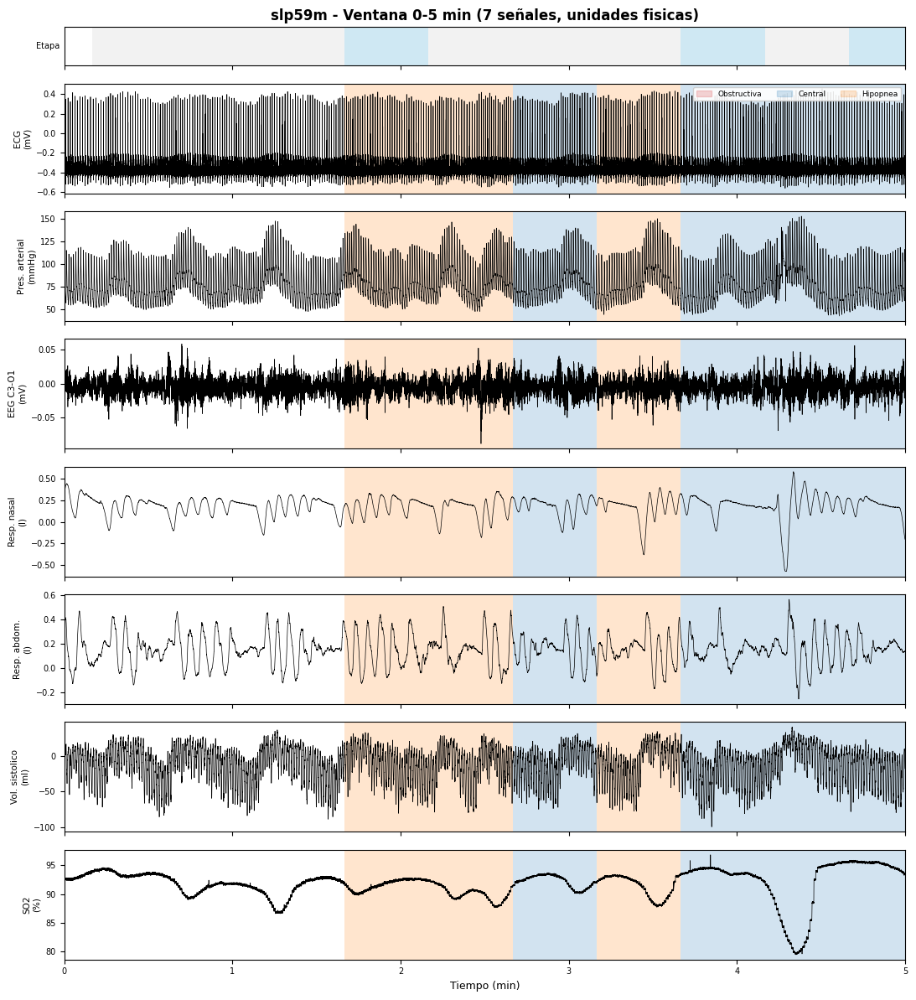

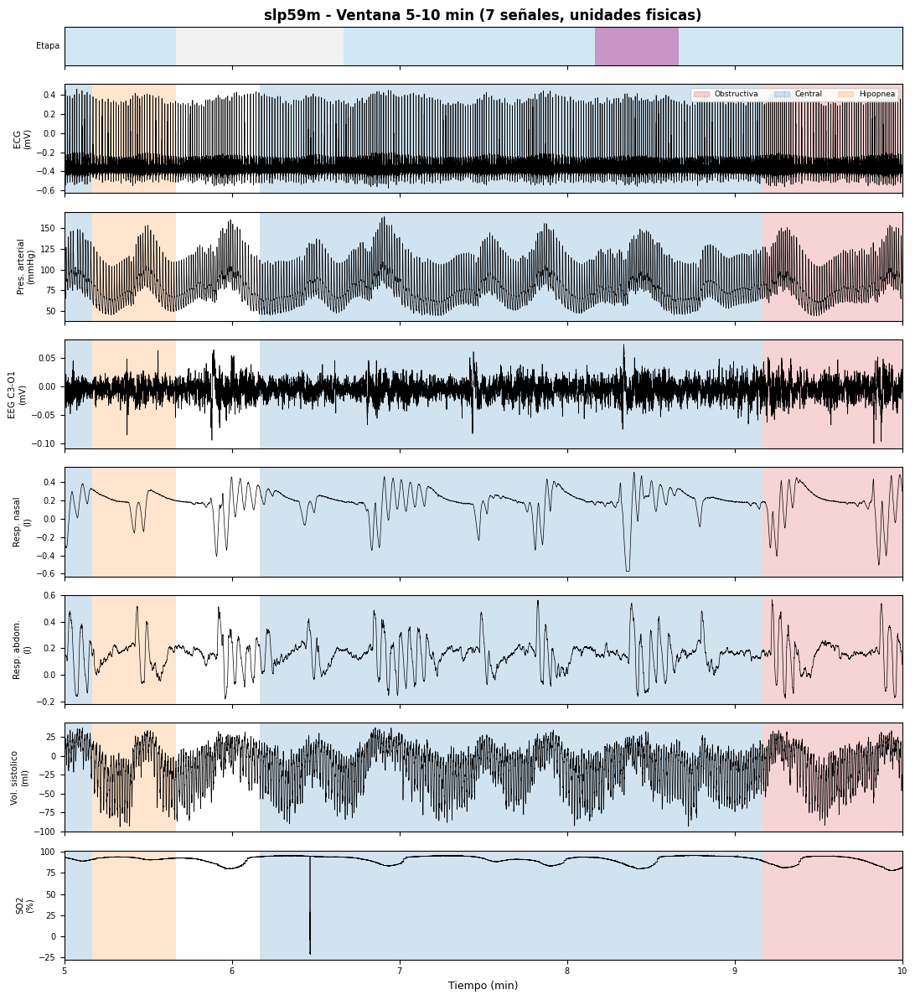

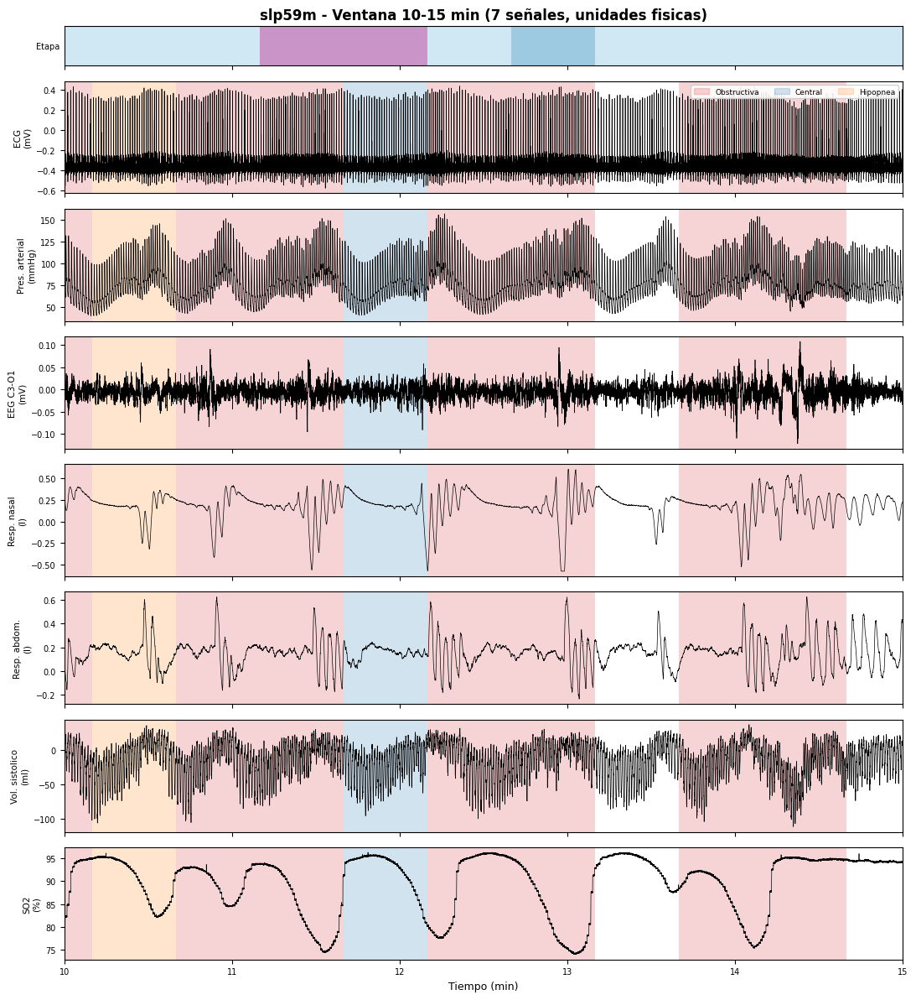

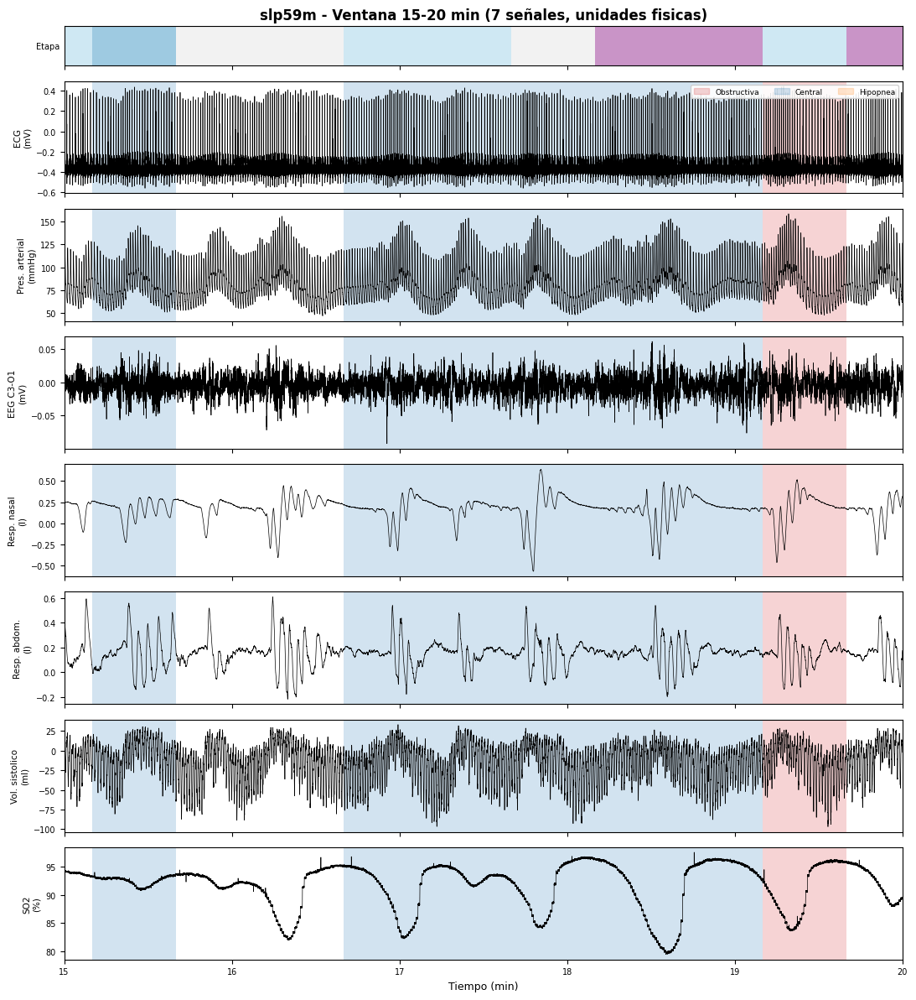

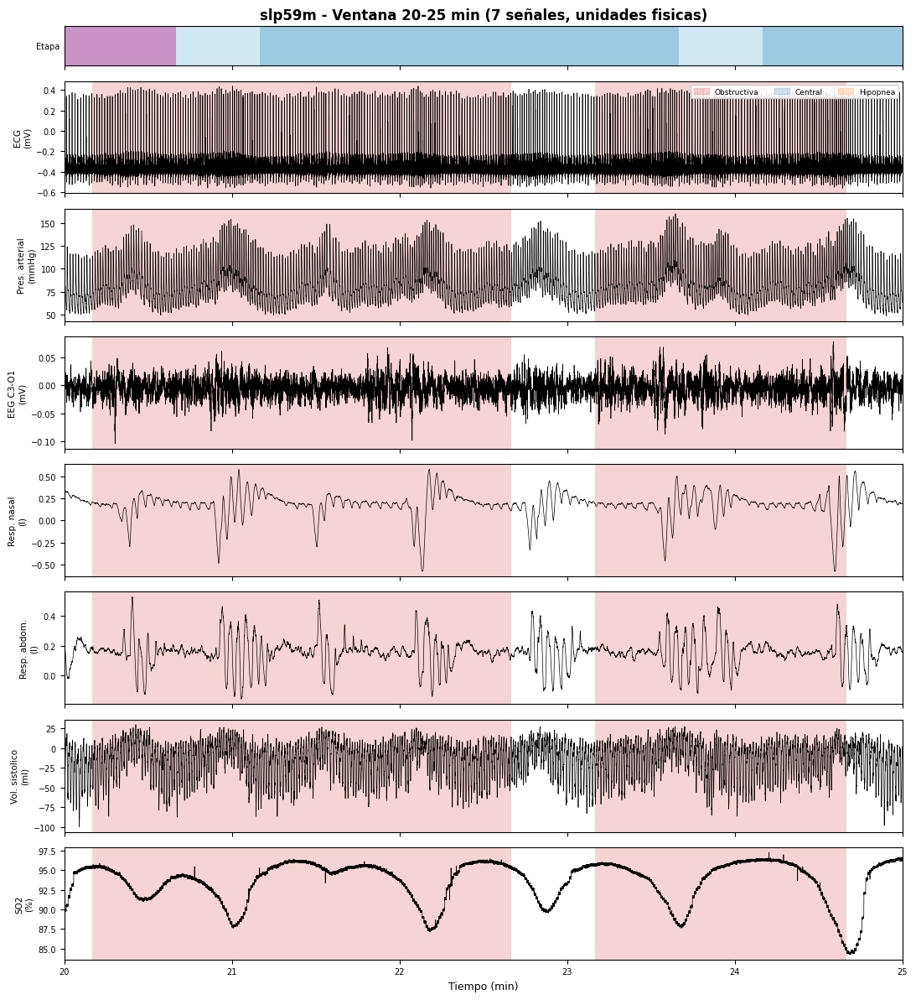

...

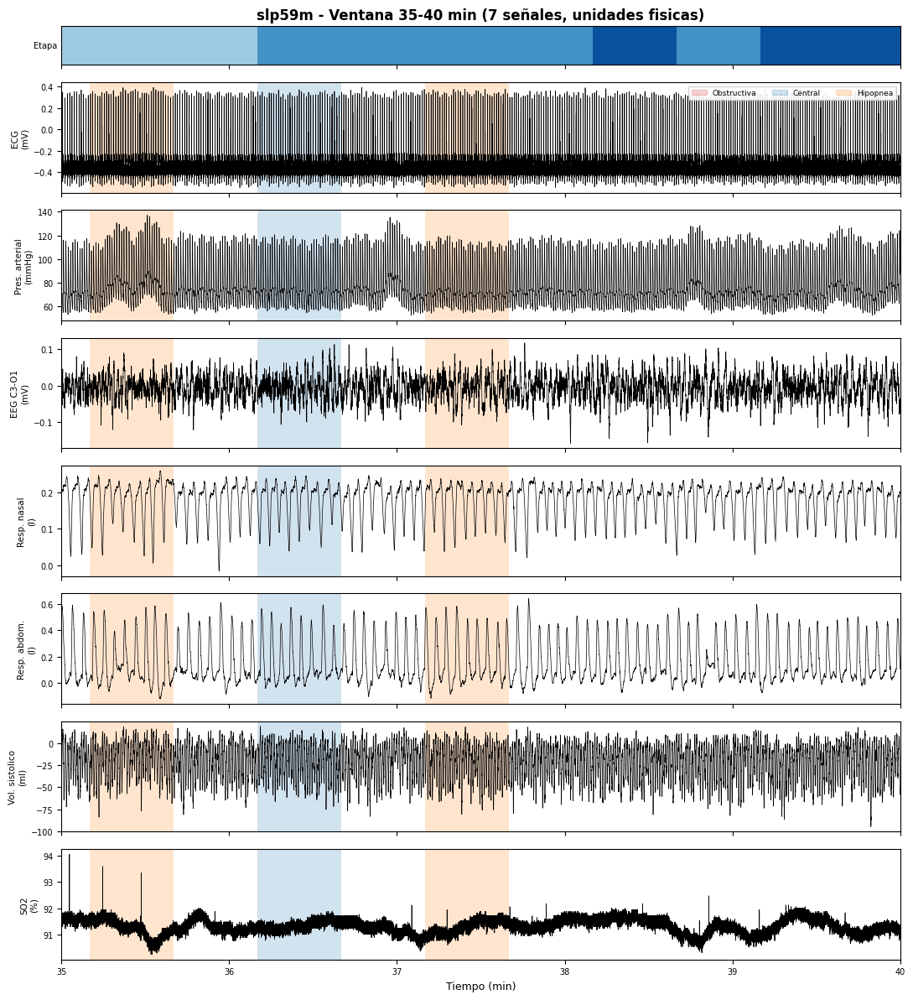

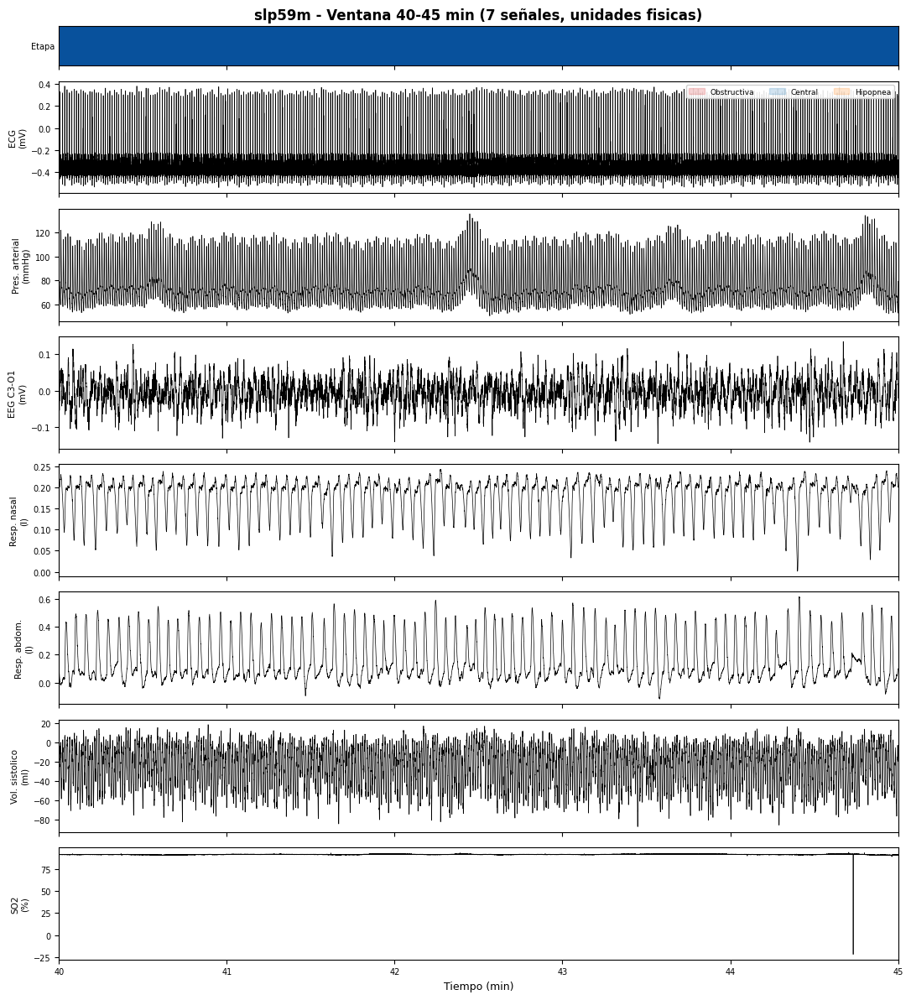

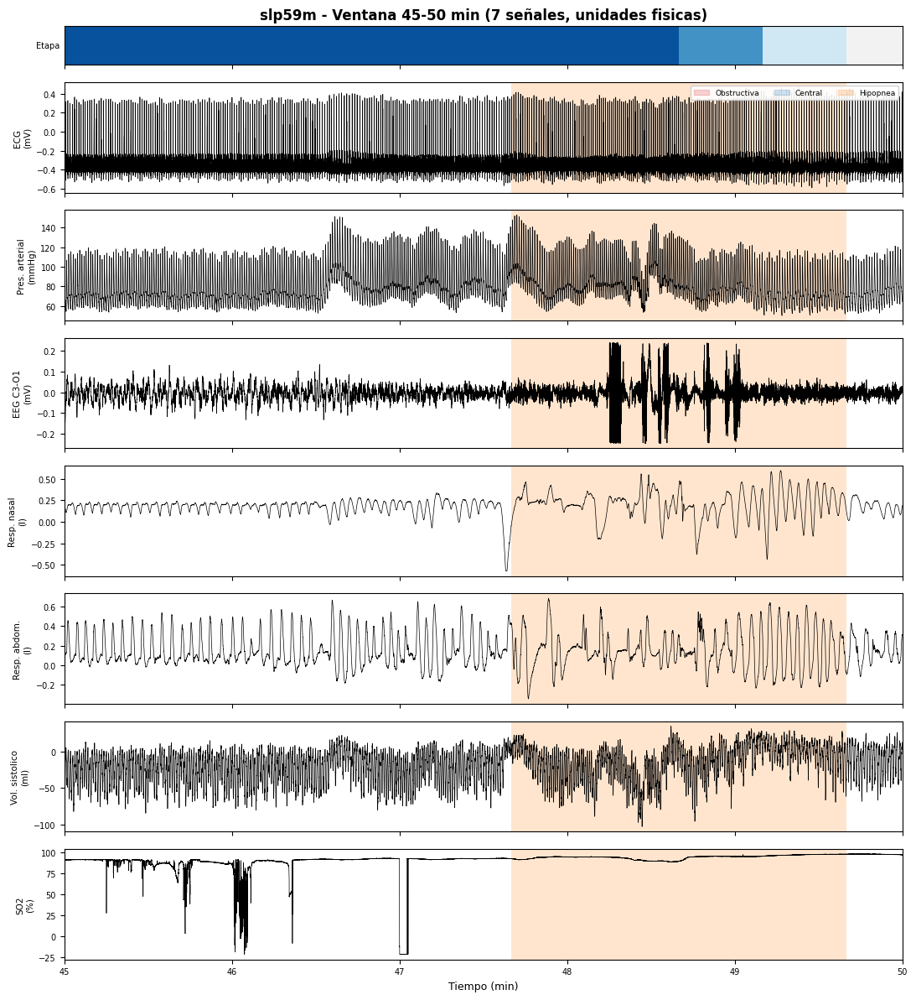

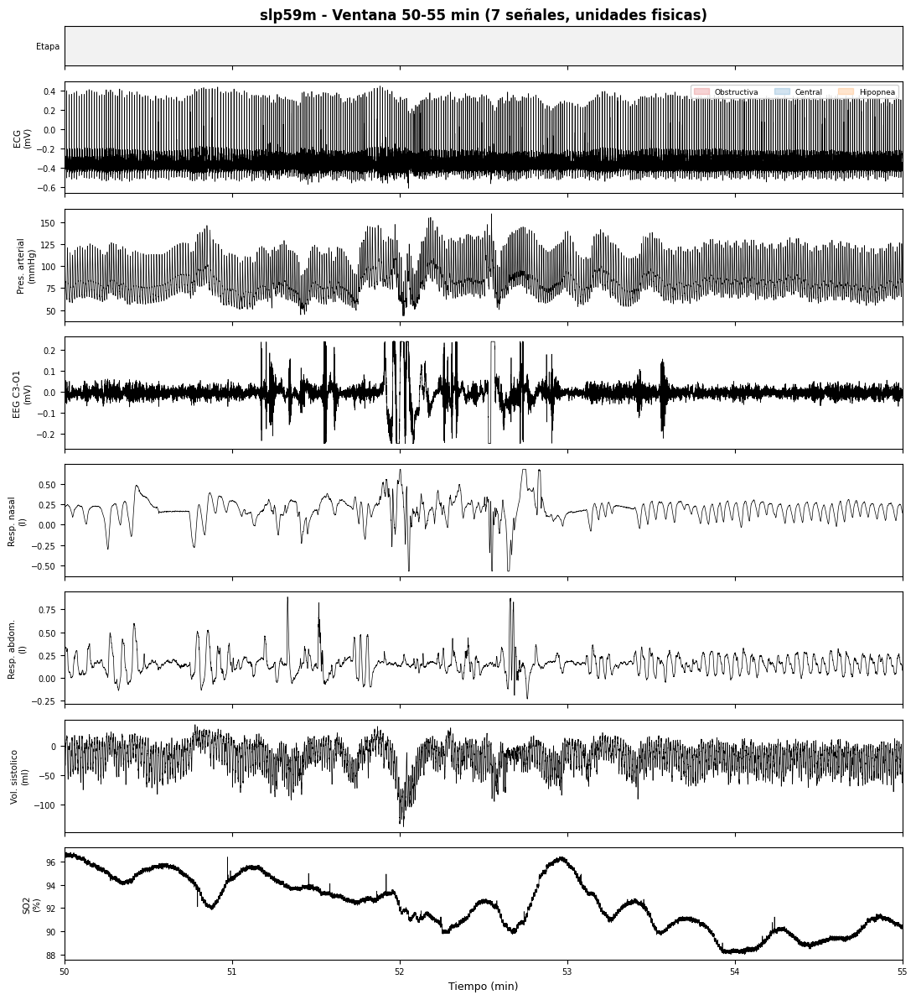

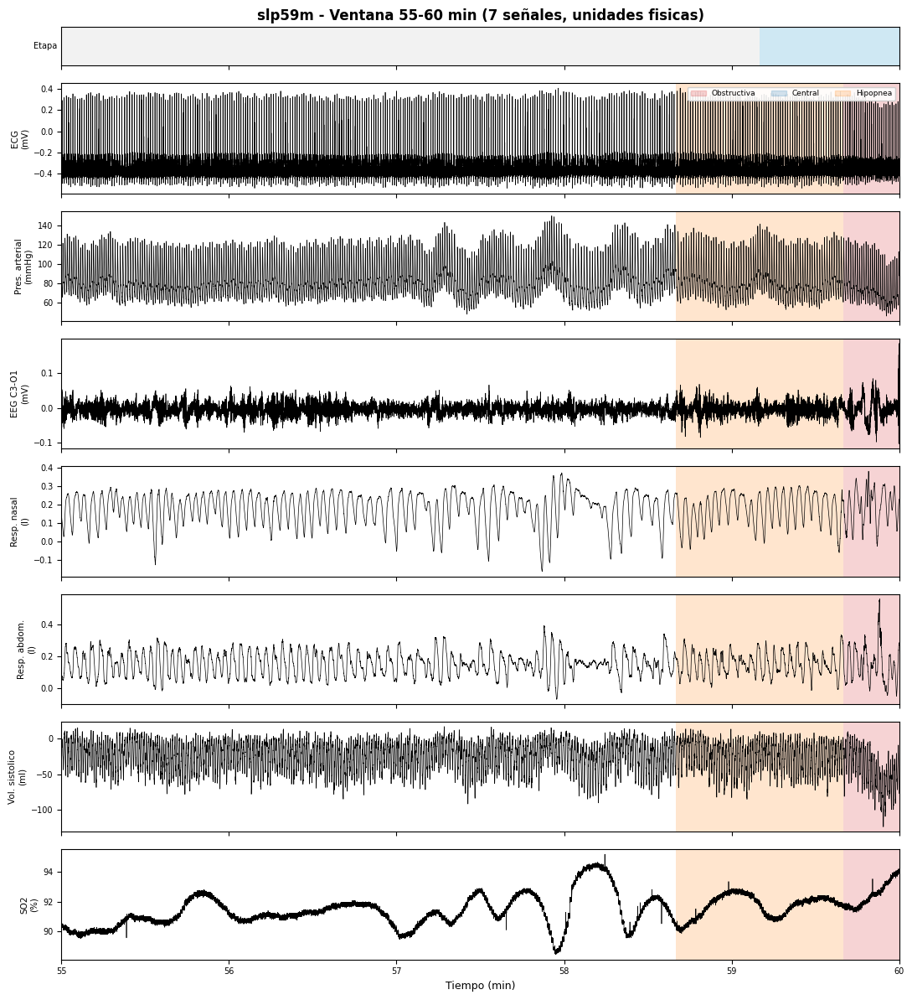

[slp59m] 12 ventanas de 5 minutos generadas en resultados/figuras/


In [7]:
for k in range(12):
    t0, t1 = k * 5, (k + 1) * 5
    graficar_ventana(fisico, fs, anotaciones, t0, t1,
                      DIR_FIGURAS / f"ventana_{t0:02d}_{t1:02d}_min.png",
                      titulo=f"slp59m - Ventana {t0}-{t1} min (7 señales, unidades fisicas)")
log("12 ventanas de 5 minutos generadas en resultados/figuras/")

## Actividad 3 — Espectrogramas


In [8]:
PARAMS_ESPECTROGRAMA = {
    "ECG": {"ventana_s": 8, "traslape": 0.75, "banda_hz": (0, 40)},
    "BP": {"ventana_s": 16, "traslape": 0.75, "banda_hz": (0, 10)},
    "EEG": {"ventana_s": 4, "traslape": 0.75, "banda_hz": (0, 40)},
    "Resp_nasal": {"ventana_s": 30, "traslape": 0.75, "banda_hz": (0, 1)},
    "Resp_abdominal": {"ventana_s": 30, "traslape": 0.75, "banda_hz": (0, 1)},
    "SV": {"ventana_s": 16, "traslape": 0.75, "banda_hz": (0, 10)},
    "SO2": {"ventana_s": 120, "traslape": 0.875, "banda_hz": (0, 0.2)},
}


def calcular_espectrograma(x, fs, ventana_s, traslape):
    nperseg = int(round(ventana_s * fs))
    noverlap = int(round(nperseg * traslape))
    f, t, Sxx = signal.spectrogram(x, fs=fs, window="hann", nperseg=nperseg, noverlap=noverlap,
                                    nfft=nperseg, detrend="constant", scaling="density", mode="psd")
    return f, t, Sxx


def _marcar_eventos_en_eje(ax, anotaciones, t0_min, t1_min, y0, y1):
    """Dibuja una franja delgada de color en la parte inferior del eje con
    los eventos anotados, usando el mismo codigo de color que las ventanas temporales."""
    alto = (y1 - y0) * 0.04
    ventana = anotaciones[(anotaciones["fin_s"] > t0_min * 60) & (anotaciones["inicio_s"] < t1_min * 60)]
    for _, ep in ventana.iterrows():
        color = _color_epoca(ep["apnea_tipo"])
        if color is None:
            continue
        ini, fin = max(ep["inicio_s"] / 60, t0_min), min(ep["fin_s"] / 60, t1_min)
        ax.axvspan(ini, fin, ymin=0, ymax=0.04, color=color, alpha=0.9, lw=0)


def graficar_espectrograma_individual(f, t_min, Sxx_db, banda_hz, nombre, anotaciones, ruta_salida):
    fmask = (f >= banda_hz[0]) & (f <= banda_hz[1])
    vmin, vmax = np.percentile(Sxx_db[fmask, :], [5, 99])
    t0_min, t1_min = t_min[0], t_min[-1]

    fig, ax = plt.subplots(figsize=(12, 4.5))
    malla = ax.pcolormesh(t_min, f[fmask], Sxx_db[fmask, :], shading="auto",
                           vmin=vmin, vmax=vmax, cmap="viridis")
    _marcar_eventos_en_eje(ax, anotaciones, t0_min, t1_min, banda_hz[0], banda_hz[1])
    ax.set_ylabel("Frecuencia (Hz)")
    ax.set_xlabel("Tiempo (min)")
    ax.set_title(f"Espectrograma - {nombre} (banda mostrada {banda_hz[0]}-{banda_hz[1]} Hz)")
    fig.colorbar(malla, ax=ax, label="Densidad espectral de potencia (dB, ref. arbitraria)")
    fig.tight_layout()
    fig.savefig(ruta_salida, dpi=300)
    plt.show()
    plt.close(fig)


def graficar_espectrogramas_alineados(espectrogramas, anotaciones, ruta_salida):
    fig, ejes = plt.subplots(len(ORDEN_CANALES), 1, figsize=(13, 16), sharex=True)
    for k, fila_idx in enumerate(ORDEN_CANALES):
        nombre = NOMBRES_CANAL[fila_idx]
        f, t_min, Sxx_db = espectrogramas[nombre]
        banda_hz = PARAMS_ESPECTROGRAMA[nombre]["banda_hz"]
        fmask = (f >= banda_hz[0]) & (f <= banda_hz[1])
        vmin, vmax = np.percentile(Sxx_db[fmask, :], [5, 99])
        ax = ejes[k]
        malla = ax.pcolormesh(t_min, f[fmask], Sxx_db[fmask, :], shading="auto",
                               vmin=vmin, vmax=vmax, cmap="viridis")
        _marcar_eventos_en_eje(ax, anotaciones, t_min[0], t_min[-1], banda_hz[0], banda_hz[1])
        ax.set_ylabel(f"{nombre}\n(Hz)", fontsize=8)
        ax.tick_params(labelsize=7)
        fig.colorbar(malla, ax=ax, fraction=0.02, pad=0.01)
    ejes[-1].set_xlabel("Tiempo (min)")
    ejes[0].set_title("Espectrogramas alineados - slp59m (las 7 señales)", fontsize=12, fontweight="bold")
    fig.tight_layout()
    fig.savefig(ruta_salida, dpi=300)
    plt.show()
    plt.close(fig)

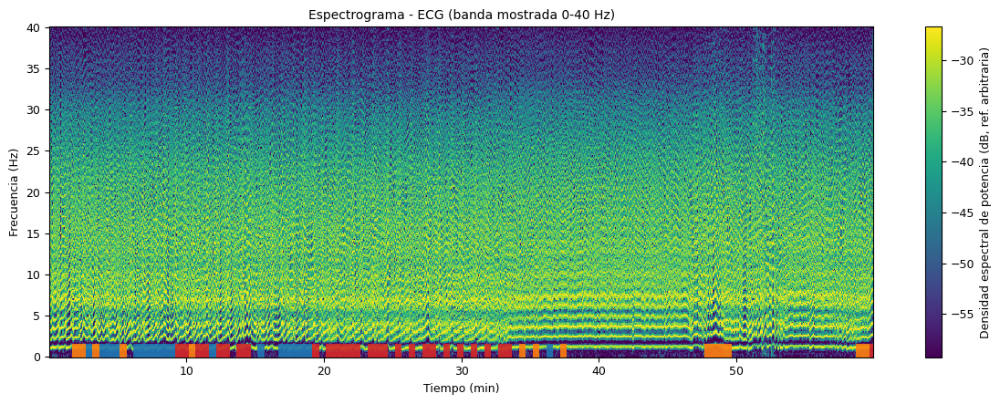

[slp59m] Espectrograma calculado: ECG


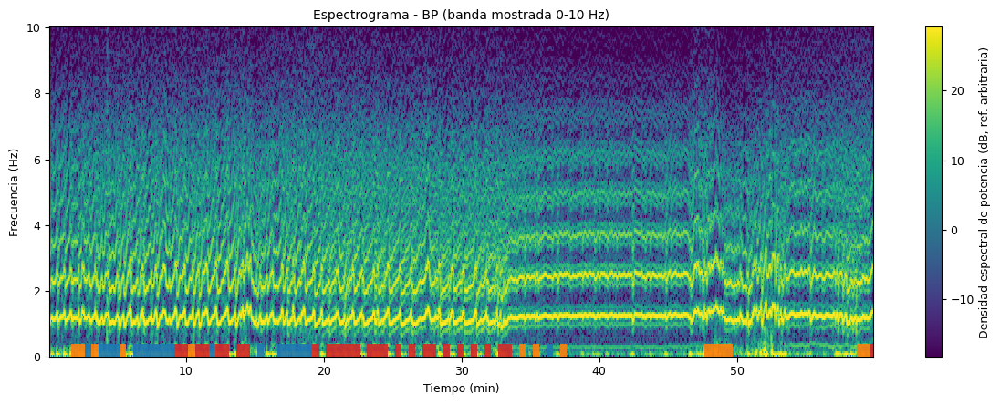

[slp59m] Espectrograma calculado: BP


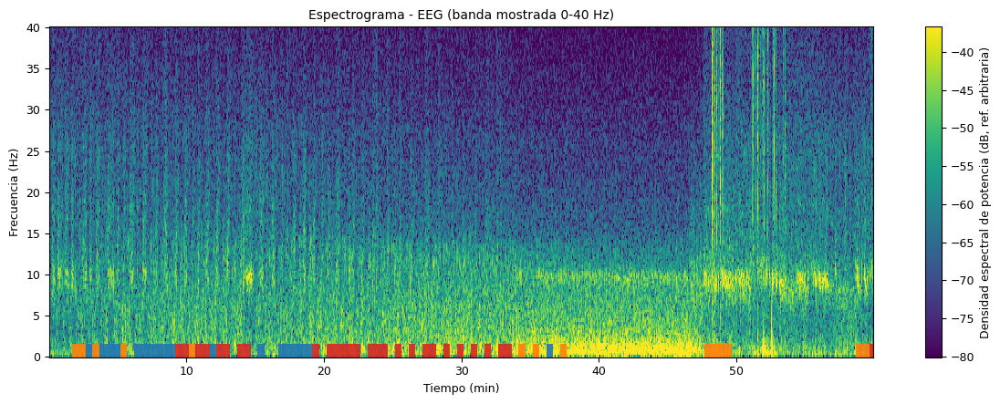

[slp59m] Espectrograma calculado: EEG


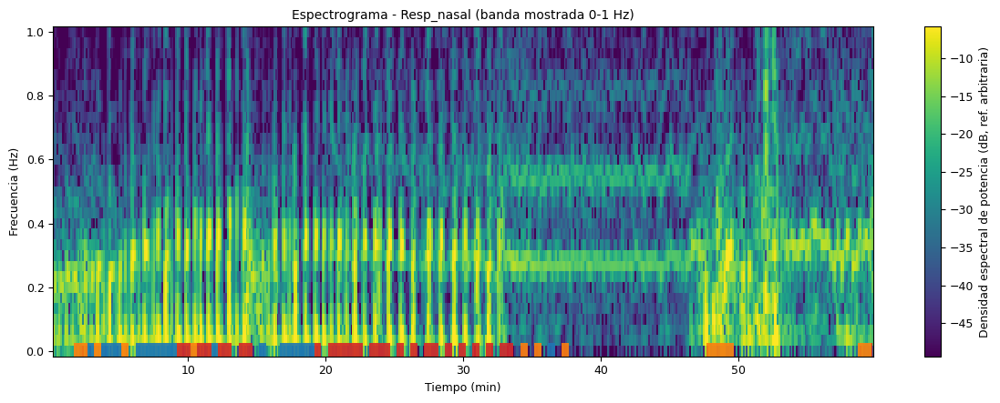

[slp59m] Espectrograma calculado: Resp_nasal


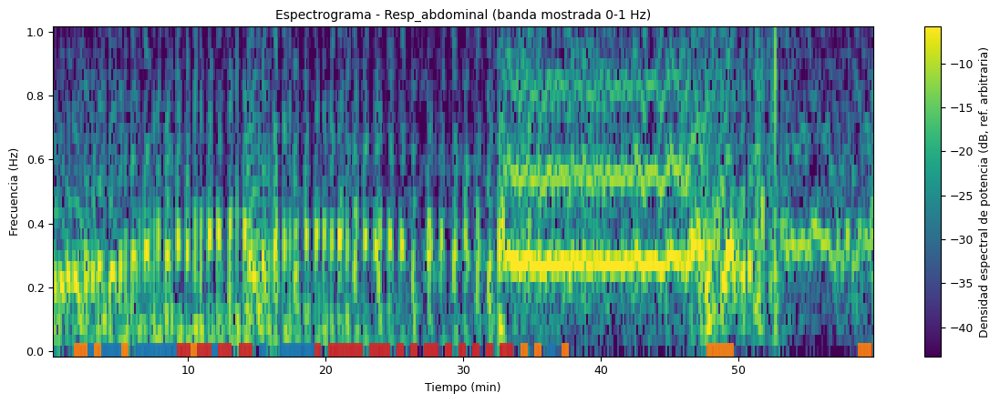

[slp59m] Espectrograma calculado: Resp_abdominal


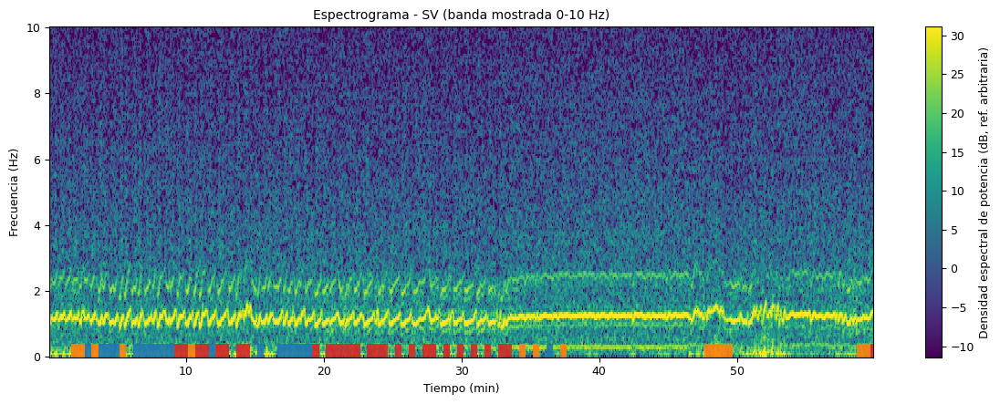

[slp59m] Espectrograma calculado: SV


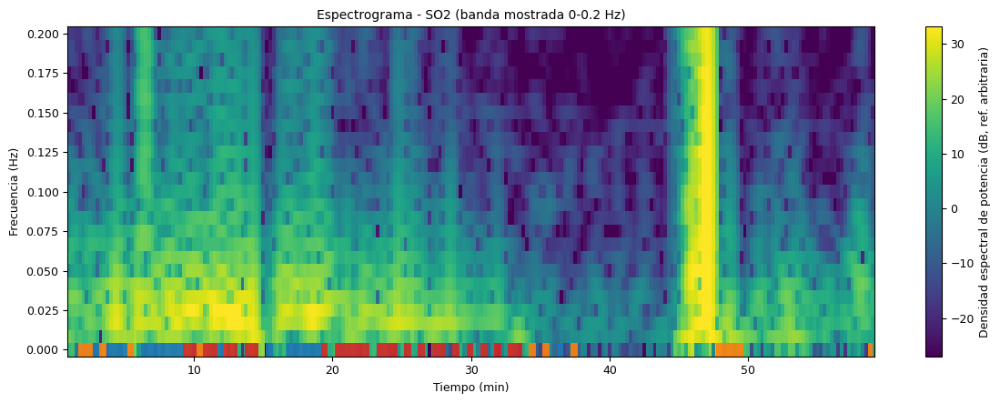

[slp59m] Espectrograma calculado: SO2


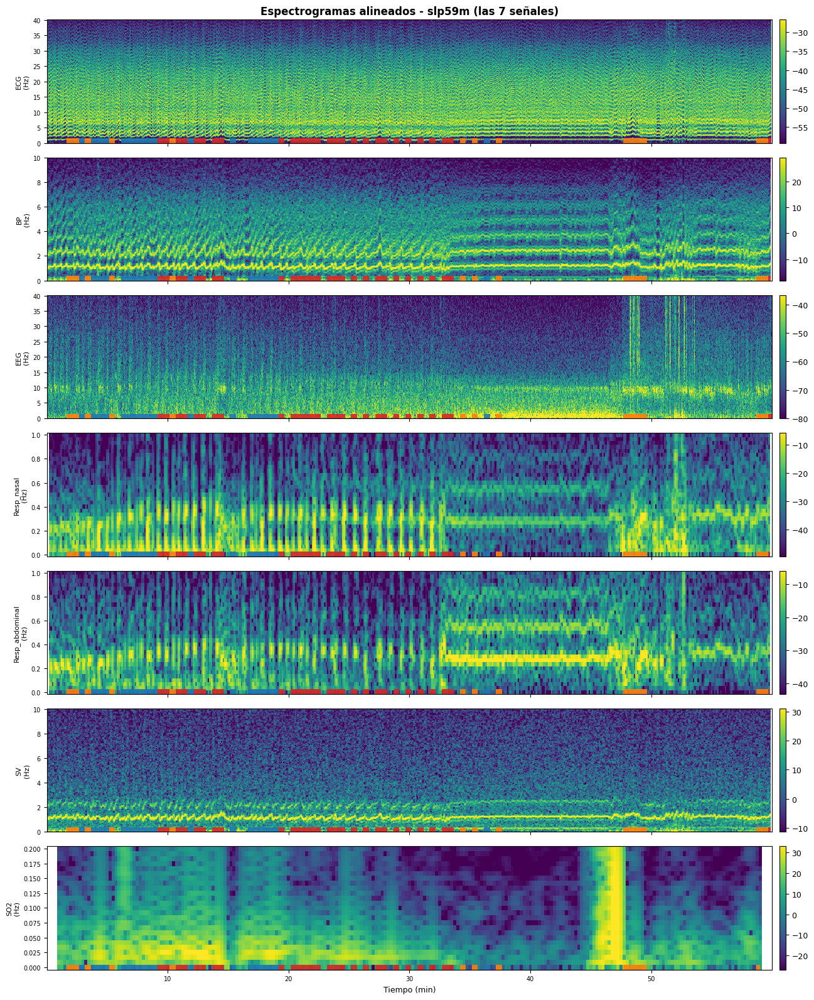

[slp59m] Figura conjunta generada: espectrogramas_alineados.png


In [9]:
espectrogramas = {}
for fila_idx in ORDEN_CANALES:
    nombre = NOMBRES_CANAL[fila_idx]
    cfg = PARAMS_ESPECTROGRAMA[nombre]
    f, t, Sxx = calcular_espectrograma(fisico[fila_idx - 1, :], fs, cfg["ventana_s"], cfg["traslape"])
    Sxx_db = 10 * np.log10(Sxx + EPS)
    t_min = t / 60.0
    espectrogramas[nombre] = (f, t_min, Sxx_db)
    graficar_espectrograma_individual(f, t_min, Sxx_db, cfg["banda_hz"], nombre, anotaciones,
                                       DIR_FIGURAS / f"espectrograma_{nombre}.png")
    log(f"Espectrograma calculado: {nombre}")

graficar_espectrogramas_alineados(espectrogramas, anotaciones, DIR_FIGURAS / "espectrogramas_alineados.png")
log("Figura conjunta generada: espectrogramas_alineados.png")

## Actividad 4 — Análisis conjunto y episodios probables


In [10]:
def graficar_episodio(fisico, fs, anotaciones, inicio_s, etiqueta, ruta_salida):
    fin_s = inicio_s + DURACION_EPOCA_S
    duracion_total = fisico.shape[1] / fs
    t0 = max(0.0, inicio_s - 60.0)
    t1 = min(duracion_total, fin_s + 60.0)
    i0, i1 = int(round(t0 * fs)), int(round(t1 * fs))
    t_seg = np.arange(i0, i1) / fs

    fig = plt.figure(figsize=(12, 11))
    gs = fig.add_gridspec(7, 1, height_ratios=[1, 1, 1, 1, 1, 1.2, 1.2], hspace=0.5)

    canales = [("Resp_nasal", 3, "Resp. nasal (l)"), ("Resp_abdominal", 4, "Resp. abdominal (l)"),
               ("SO2", 6, "SO2 (%)"), ("EEG", 2, "EEG C3-O1 (mV)"), ("ECG", 0, "ECG (mV)")]
    for k, (nombre, fila_idx, etq) in enumerate(canales):
        ax = fig.add_subplot(gs[k])
        ax.plot(t_seg, fisico[fila_idx, i0:i1], color="black", linewidth=0.6)
        ax.axvspan(inicio_s, fin_s, color="#d62728", alpha=0.15)
        ax.set_ylabel(etq, fontsize=8)
        ax.tick_params(labelsize=7)
        ax.margins(x=0)
        if k < len(canales) - 1:
            ax.set_xticklabels([])

    f_eeg, t_eeg, Sxx_eeg = calcular_espectrograma(fisico[2, i0:i1], fs, ventana_s=2, traslape=0.75)
    ax_eeg = fig.add_subplot(gs[5])
    Sxx_eeg_db = 10 * np.log10(Sxx_eeg + EPS)
    fmask = f_eeg <= 30
    vmin, vmax = np.percentile(Sxx_eeg_db[fmask, :], [5, 99])
    ax_eeg.pcolormesh(t_eeg + t0, f_eeg[fmask], Sxx_eeg_db[fmask, :], shading="auto",
                       vmin=vmin, vmax=vmax, cmap="viridis")
    ax_eeg.axvline(inicio_s, color="white", ls="--", lw=0.8)
    ax_eeg.axvline(fin_s, color="white", ls="--", lw=0.8)
    ax_eeg.set_ylabel("Espectr. EEG\n(Hz)", fontsize=8)
    ax_eeg.tick_params(labelsize=7)

    f_n, t_n, Sxx_n = calcular_espectrograma(fisico[3, i0:i1], fs, ventana_s=10, traslape=0.75)
    ax_n = fig.add_subplot(gs[6])
    Sxx_n_db = 10 * np.log10(Sxx_n + EPS)
    fmask_n = f_n <= 1.0
    vmin_n, vmax_n = np.percentile(Sxx_n_db[fmask_n, :], [5, 99])
    ax_n.pcolormesh(t_n + t0, f_n[fmask_n], Sxx_n_db[fmask_n, :], shading="auto",
                     vmin=vmin_n, vmax=vmax_n, cmap="viridis")
    ax_n.axvline(inicio_s, color="white", ls="--", lw=0.8)
    ax_n.axvline(fin_s, color="white", ls="--", lw=0.8)
    ax_n.set_ylabel("Espectr. nasal\n(Hz)", fontsize=8)
    ax_n.set_xlabel("Tiempo (s, referido al inicio del registro)")
    ax_n.tick_params(labelsize=7)

    fig.suptitle(f"Episodio {etiqueta} - epoca {inicio_s:.0f}-{fin_s:.0f} s", fontsize=12, fontweight="bold")
    fig.tight_layout(rect=[0, 0, 1, 0.97])
    fig.savefig(ruta_salida, dpi=300, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    return t0, t1


def resumen_episodio(anotaciones, inicio_s):
    """Imprime la anotacion clinica exacta y valores minimos/maximos simples
    de apoyo (lectura directa de la señal mostrada, sin metricas adicionales)."""
    fin_s = inicio_s + DURACION_EPOCA_S
    fila = anotaciones[(anotaciones["inicio_s"] - inicio_s).abs() < 1.0].iloc[0]
    i0, i1 = int(round(inicio_s * fs)), int(round(fin_s * fs))
    so2_epoca = fisico[6, i0:i1]
    so2_prev = fisico[6, max(0, i0 - int(60 * fs)):i0]
    so2_post = fisico[6, i1:i1 + int(60 * fs)]
    log(f"Epoca {inicio_s:.0f}-{fin_s:.0f} s | etapa={ETAPAS_SUENO.get(fila['etapa'], fila['etapa'])} "
        f"| eventos='{fila['eventos'] or '(ninguno)'}'")
    log(f"  SO2: previo(60s)={so2_prev.mean():.1f}% -> epoca min={so2_epoca.min():.1f}% "
        f"-> posterior(60s) min={so2_post.min() if so2_post.size else float('nan'):.1f}%")

[slp59m] Epoca 550-580 s | etapa=Etapa 1 | eventos='X'
[slp59m]   SO2: previo(60s)=91.2% -> epoca min=80.8% -> posterior(60s) min=77.6%


C:\Users\PC\AppData\Local\Temp\ipykernel_3632\1654410684.py:50: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 1, 0.97])


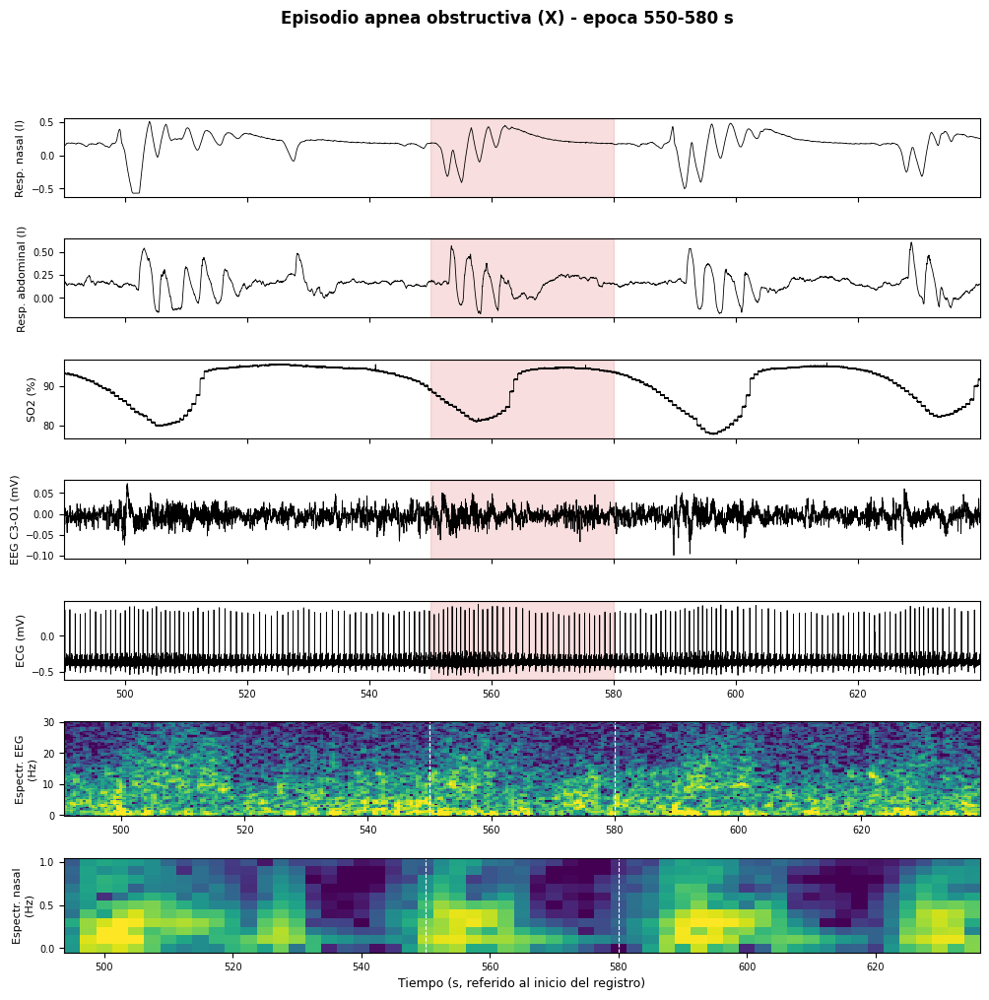

(490.0, 640.0)

In [11]:
resumen_episodio(anotaciones, 550)
graficar_episodio(fisico, fs, anotaciones, 550, "apnea obstructiva (X)",
                   DIR_FIGURAS / "episodio_obstructiva_X_550s.png")

**Episodio 1 — Apnea obstructiva (marca `X`), época 550–580 s (etapa 1).**
Durante la época señalada, la **respiración nasal** muestra una reducción
marcada de su amplitud, mientras que la **respiración abdominal** conserva
oscilaciones de amplitud similar o mayor a la basal cercana: el patrón es
compatible con una obstrucción de la vía aérea con esfuerzo respiratorio
persistente, tal como plantea la hipótesis para eventos obstructivos. La
**SO2** ya cae de forma apreciable dentro de la propia época (de ~91.2% en
el minuto previo a un mínimo de ~80.8% dentro de la época) y continúa
bajando ligeramente en la ventana posterior de 60 s (mínimo ~77.6%, ver
valores impresos arriba), consistente con la caída de oxigenación asociada
al evento y con cierto retardo circulatorio adicional. No se
observa un cambio evidente y sostenido en el espectrograma de EEG dentro de
la banda mostrada (0–30 Hz) coincidente con la época, aunque la marca `X`
indica arousal asociado. El comportamiento observado **coincide** con la
anotación clínica de apnea obstructiva con arousal.

[slp59m] Epoca 160-190 s | etapa=Vigilia | eventos='CAA'
[slp59m]   SO2: previo(60s)=90.9% -> epoca min=90.1% -> posterior(60s) min=87.7%


C:\Users\PC\AppData\Local\Temp\ipykernel_3632\1654410684.py:50: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 1, 0.97])


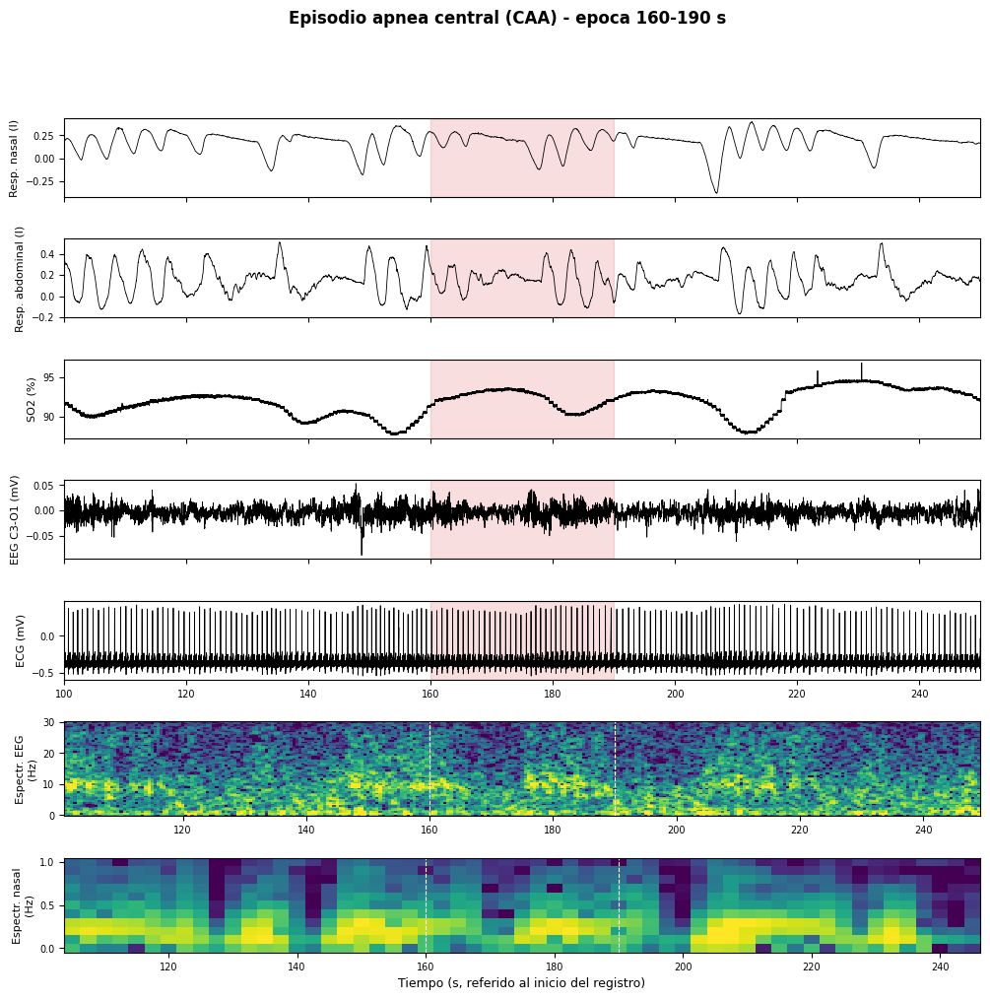

(100.0, 250.0)

In [12]:
resumen_episodio(anotaciones, 160)
graficar_episodio(fisico, fs, anotaciones, 160, "apnea central (CAA)",
                   DIR_FIGURAS / "episodio_central_CAA_160s.png")

**Episodio 2 — Apnea central con arousal (marca `CAA`), época 160–190 s
(etapa vigilia).** A diferencia del episodio anterior, aquí tanto la
**respiración nasal** como la **respiración abdominal** muestran una
reducción simultánea de su amplitud dentro de la época marcada, sin el
esfuerzo abdominal conservado que se observó en la apnea obstructiva. Este
patrón —caída conjunta de ambas señales respiratorias— es precisamente el
que la hipótesis asocia a un evento **central**. La SO2 se mantiene casi
sin cambio dentro de la propia época (de ~90.9% a un mínimo de ~90.1%) y
solo baja de forma más notoria en la ventana posterior de 60 s (mínimo
~87.7%, valores impresos arriba), es decir que la desaturación —cuando
ocurre— se manifiesta con retardo respecto del evento. Esto ilustra que no
todos los eventos anotados producen una desaturación inmediata y medible
dentro de los 30 s de la época, algo consistente con lo que indica
`ApneaSueño.pdf` sobre que las apneas centrales aisladas y breves no
siempre se acompañan de una desaturación evidente. El comportamiento
observado **coincide** con la anotación de apnea central con arousal.

[slp59m] Epoca 2110-2140 s | etapa=Etapa 2 | eventos='H'
[slp59m]   SO2: previo(60s)=91.5% -> epoca min=90.2% -> posterior(60s) min=90.8%


C:\Users\PC\AppData\Local\Temp\ipykernel_3632\1654410684.py:50: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 1, 0.97])


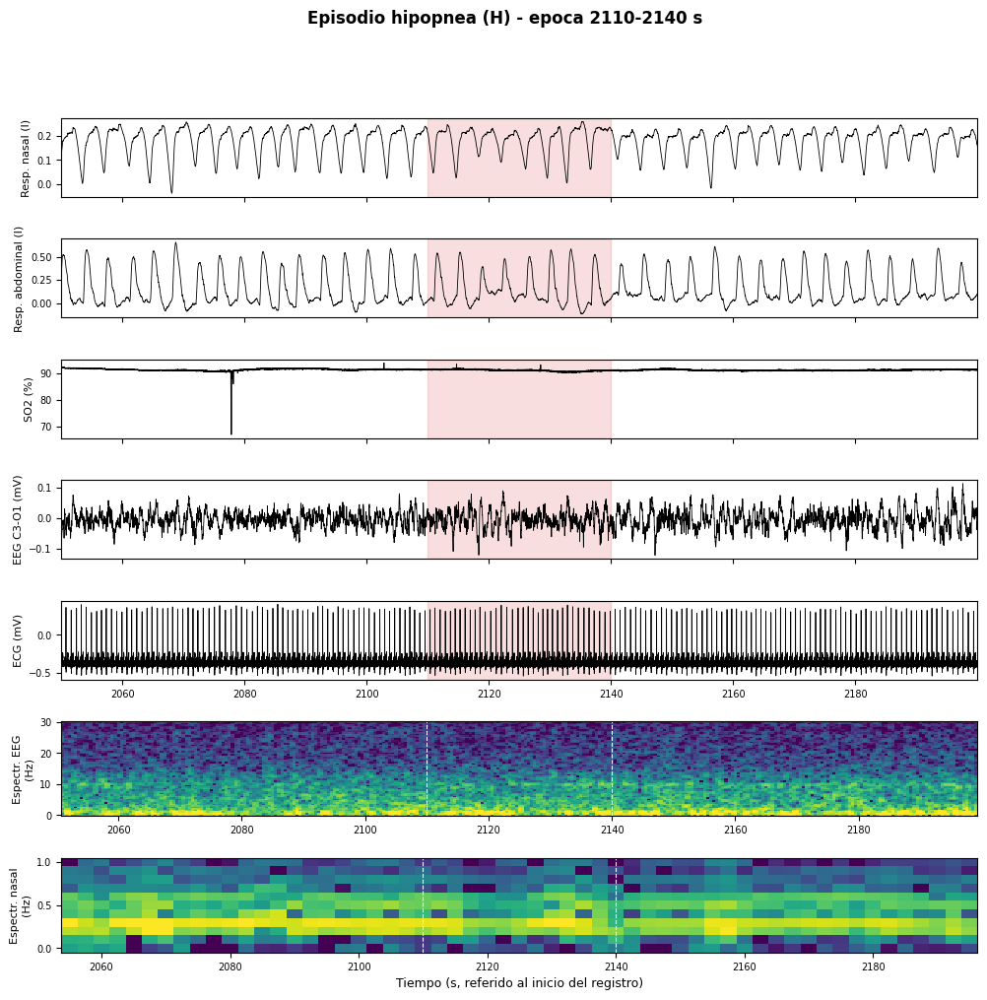

(2050.0, 2200.0)

In [ ]:
resumen_episodio(anotaciones, 2110)
graficar_episodio(fisico, fs, anotaciones, 2110, "hipoapnea (H)",
                   DIR_FIGURAS / "episodio_hipopnea_H_2110s.png")

**Episodio 3 — Hipoapnea sin arousal (marca `H`), época 2110–2140 s (etapa
2).** Se observa una reducción **parcial** (no un cese) de la amplitud
tanto en respiración nasal como abdominal, menos marcada que en los
episodios de apnea anteriores, consistente con la definición de hipoapnea de
la hipótesis de trabajo. La SO2 muestra una variación leve alrededor de la
época. El espectrograma de EEG no muestra un cambio espectral notorio
coincidente con la época, congruente con que esta marca **no** incluye
arousal (`H`, sin la `A` de `HA`). El comportamiento observado **coincide**
razonablemente con la anotación de hipoapnea, aunque la reducción es más
sutil que en los episodios de apnea, lo que dificulta un poco más su
identificación visual directa.

[slp59m] Epoca 100-130 s | etapa=Etapa 1 | eventos='HA'
[slp59m]   SO2: previo(60s)=91.0% -> epoca min=89.8% -> posterior(60s) min=87.7%


C:\Users\PC\AppData\Local\Temp\ipykernel_3632\1654410684.py:50: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 1, 0.97])


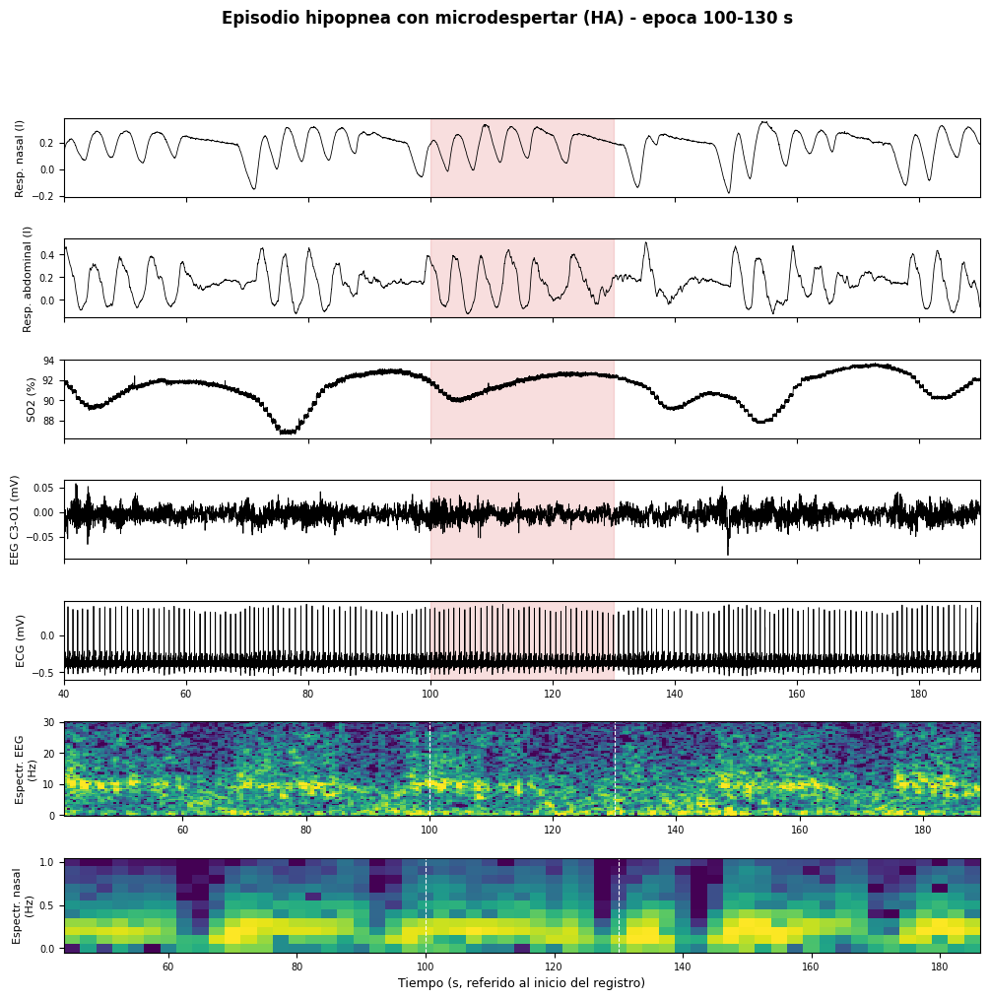

(40.0, 190.0)

In [ ]:
resumen_episodio(anotaciones, 100)
graficar_episodio(fisico, fs, anotaciones, 100, "hipoapnea con microdespertar (HA)",
                   DIR_FIGURAS / "episodio_arousal_HA_100s.png")

**Episodio 4 — Hipoapnea con microdespertar (marca `HA`), época 100–130 s
(etapa 1).** De forma similar al episodio 3, ambas señales respiratorias
muestran una reducción parcial de amplitud, algo mayor en este caso. A
diferencia de lo que se esperaría, el espectrograma de EEG **no** muestra
un cambio claramente localizado ni distinguible del resto del segmento
dentro de la banda mostrada (0–30 Hz): la banda alrededor de 8–11 Hz está
presente de forma bastante continua tanto dentro como fuera de la época
marcada, por lo que el microdespertar anotado no se puede confirmar
visualmente solo a partir de este espectrograma. La SO2 baja de forma leve
dentro de la época (de ~91.0% a ~89.8%) y sigue descendiendo en la ventana
posterior de 60 s (mínimo ~87.7%), mostrando de nuevo el patrón de caída
con cierto retardo. El comportamiento respiratorio y de SO2 es
**compatible** con la anotación de hipoapnea con arousal, pero este episodio
ilustra bien una limitación real del análisis: un microdespertar de pocos
segundos no siempre se distingue con claridad del ruido de fondo habitual
del EEG con la resolución usada aquí.

[slp59m] Epoca 2380-2410 s | etapa=Etapa 4 | eventos='(ninguno)'
[slp59m]   SO2: previo(60s)=91.3% -> epoca min=90.6% -> posterior(60s) min=90.2%


C:\Users\PC\AppData\Local\Temp\ipykernel_3632\1654410684.py:50: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 1, 0.97])


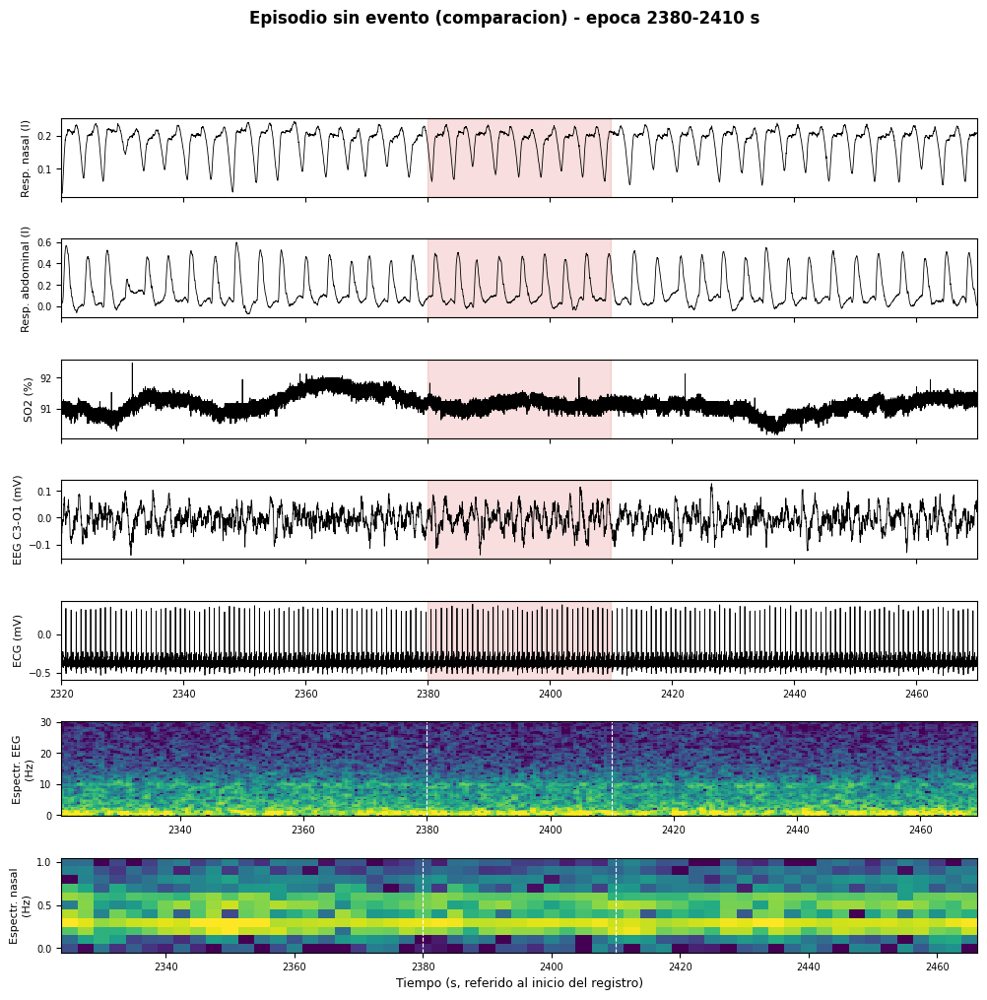

(2320.0, 2470.0)

In [15]:
resumen_episodio(anotaciones, 2380)
graficar_episodio(fisico, fs, anotaciones, 2380, "sin evento (comparacion)",
                   DIR_FIGURAS / "episodio_sin_evento_2380s.png")

**Episodio 5 — Intervalo sin eventos, época 2380–2410 s (etapa 4, sueño
profundo), usado como comparación.** La respiración nasal y abdominal
muestran un patrón regular y de amplitud estable, sin las caídas bruscas
observadas en los episodios anteriores; la SO2 se mantiene estable y no hay
cambios espectrales notorios en el EEG. Esta época **no tiene marca de
evento** y, en efecto, no se observa ningún patrón compatible con apnea o
hipoapnea, lo que la hace útil como referencia basal para contrastar con los
episodios 1–4.